In [1]:
!pip install -q condacolab
import condacolab
# condacolab.install()
condacolab.install_miniconda()

✨🍰✨ Everything looks OK!


In [4]:
!conda update -n base -c conda-forge conda

Solving environment: / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - done


==> WARNING: A newer version of conda exists. <==
  current version: 23.1.0
  latest version: 23.11.0

Please update conda by running

    $ conda update -n base -c conda-forge conda

Or to minimize the number of packages updated during conda update use

     conda install conda=23.11.0



## Package Plan ##

  environment location: /usr/local

  added / updated specs:
    - conda


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    brotli-python-1.1.0        |  py310hc6cd4ac_1         341 KB  conda-forge
    bzip2-1.0.8                |       hd590300_5         248 KB  conda-forge
    c-ares-1.25.0              |       hd590300_0         153 KB  conda-forge
    ca-certificates-2023.11.17 |       hbcca054_0         151 KB  conda-forge
    certifi-2023.11.17    

In [5]:
!conda --version

conda 23.1.0


In [7]:
!pip install keras-tuner --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.9/128.9 kB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 152.8/152.8 kB 13.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 28.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 40.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.2/130.2 kB 11.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 240.6/240.6 kB 18.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 42.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.5/87.5 kB 10.4 MB/s eta 0:00:00


In [8]:
import tensorflow as tf
import numpy as np
import os
import PIL
import PIL.Image
import tensorflow_datasets as tfds
import pathlib
import matplotlib.pyplot as plt
import datetime
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Rescaling
from tensorflow.keras.callbacks import EarlyStopping, TensorBoard
from keras_tuner.tuners import RandomSearch
%load_ext tensorboard
log_folder = "/content/drive/MyDrive/Projects/playing_cards/logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
# !rm -rf /content/drive/MyDrive/Projects/playing_cards/logs/

In [ ]:
# import tensorflow as tf
# import numpy as np
# import os
# import PIL
# import PIL.Image
# import tensorflow_datasets as tfds
# import pathlib
# import matplotlib.pyplot as plt
# import datetime
# from tensorflow.keras.callbacks import TensorBoard
# %load_ext tensorboard
# log_folder = "/content/drive/MyDrive/Projects/playing_cards/logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
# # !rm -rf /content/drive/MyDrive/Projects/playing_cards/logs/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [14]:
test_dir = pathlib.Path("/content/drive/MyDrive/Projects/playing_cards/data/images/test")
val_dir = pathlib.Path("/content/drive/MyDrive/Projects/playing_cards/data/images/valid")
train_dir = pathlib.Path("/content/drive/MyDrive/Projects/playing_cards/data/images/train")

In [15]:
image_count_test = len(list(test_dir.glob('*/*.jpg')))
image_count_val = len(list(val_dir.glob('*/*.jpg')))
image_count_train = len(list(train_dir.glob('*/*.jpg')))
print(f"test: {image_count_test}\nval: {image_count_val}\ntrain: {image_count_train}")

test: 265
val: 265
train: 7624


In [16]:
joker = list(train_dir.glob("joker/*"))
ace_clubs = list(train_dir.glob("ace_of_clubs/*"))

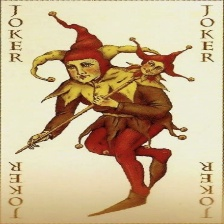

In [17]:
PIL.Image.open(str(joker[0]))

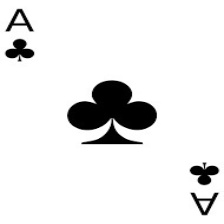

In [18]:
PIL.Image.open(str(ace_clubs[0]))

In [19]:
batch_size = 32
img_height = 180
img_width = 180

In [20]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  train_dir,
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)


val_ds = tf.keras.utils.image_dataset_from_directory(
  val_dir,
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 7624 files belonging to 53 classes.
Found 265 files belonging to 53 classes.


In [21]:
class_names = train_ds.class_names
print(class_names)

['ace_of_clubs', 'ace_of_diamonds', 'ace_of_hearts', 'ace_of_spades', 'eight_of_clubs', 'eight_of_diamonds', 'eight_of_hearts', 'eight_of_spades', 'five_of_clubs', 'five_of_diamonds', 'five_of_hearts', 'five_of_spades', 'four_of_clubs', 'four_of_diamonds', 'four_of_hearts', 'four_of_spades', 'jack_of_clubs', 'jack_of_diamonds', 'jack_of_hearts', 'jack_of_spades', 'joker', 'king_of_clubs', 'king_of_diamonds', 'king_of_hearts', 'king_of_spades', 'nine_of_clubs', 'nine_of_diamonds', 'nine_of_hearts', 'nine_of_spades', 'queen_of_clubs', 'queen_of_diamonds', 'queen_of_hearts', 'queen_of_spades', 'seven_of_clubs', 'seven_of_diamonds', 'seven_of_hearts', 'seven_of_spades', 'six_of_clubs', 'six_of_diamonds', 'six_of_hearts', 'six_of_spades', 'ten_of_clubs', 'ten_of_diamonds', 'ten_of_hearts', 'ten_of_spades', 'three_of_clubs', 'three_of_diamonds', 'three_of_hearts', 'three_of_spades', 'two_of_clubs', 'two_of_diamonds', 'two_of_hearts', 'two_of_spades']


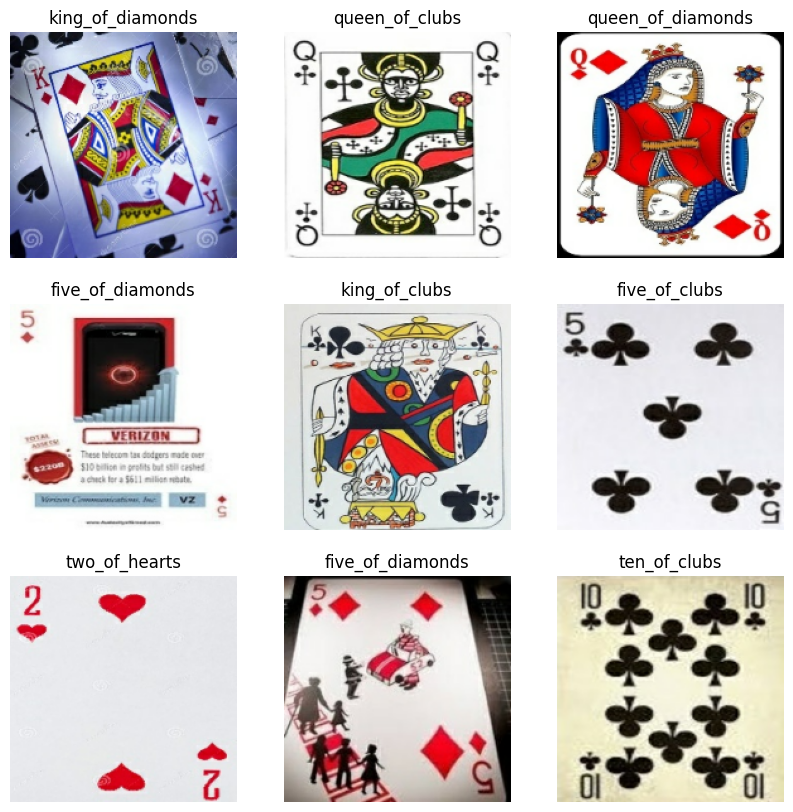

In [22]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [23]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 180, 180, 3)
(32,)


In [24]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [25]:
num_classes = 53

model = tf.keras.Sequential([
  tf.keras.layers.Rescaling(1./255),
  tf.keras.layers.Conv2D(32, 3, activation='relu'),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Conv2D(32, 3, activation='relu'),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Conv2D(32, 3, activation='relu'),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(128, activation='relu'),
  tf.keras.layers.Dense(num_classes)
])

In [26]:
model.compile(
  optimizer='adam',
  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

In [27]:
cb = [TensorBoard(log_dir=log_folder,
                         histogram_freq=1,
                         write_graph=True,
                         write_images=True,
                         update_freq='epoch',
                         profile_batch=2,
                         embeddings_freq=1)]

In [28]:
%tensorboard --logdir "/content/drive/MyDrive/Projects/playing_cards/logs/fit/"

<IPython.core.display.Javascript object>

In [29]:
model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=3,
  callbacks = cb
)

Epoch 1/3
239/239 [==============================] - 1285s 5s/step - loss: 2.7387 - accuracy: 0.2992 - val_loss: 1.5544 - val_accuracy: 0.5472
Epoch 2/3
239/239 [==============================] - 317s 1s/step - loss: 1.5948 - accuracy: 0.5746 - val_loss: 1.2686 - val_accuracy: 0.6792
Epoch 3/3
239/239 [==============================] - 325s 1s/step - loss: 0.9652 - accuracy: 0.7339 - val_loss: 1.3063 - val_accuracy: 0.6792


In [31]:
%tensorboard --logdir logs

Reusing TensorBoard on port 6007 (pid 26188), started 16:18:15 ago. (Use '!kill 26188' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [ ]:
print(logdir)

logs/20231219-224050
